# Project Title: Store Sales - Time Series Forecasting & Demand Prediction

## Project Summary: Store Sales Forecasting for Favorita
This project focuses on time series forecasting to predict unit sales for items across various Corporación Favorita grocery stores in Ecuador.

### Objectives
Understand the data: Explore store-specific factors, product families, promotions, and sales trends.

Predict store sales: Build a reliable model to forecast sales, aiding inventory planning, promotions, and business decisions.

### Methodology
Data Exploration: Analyze data distributions, relationships, and quality issues.

Data Preparation: Handle missing values, engineer features, and encode categorical data.

Time Series Analysis: Study trends, seasonality, and outliers.

Model Selection & Training: Train time series models, incorporating external factors like holidays and oil prices.

Model Evaluation: Use metrics like MAE, RMSE, and MAPE to assess accuracy.

Model Deployment: Forecast future sales using the test dataset and evaluate performance.

# Setup

## Importation

In [ ]:
# Data Handling
import numpy as np
import pandas as pd
import seaborn as sns

# Visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px

# Other Packages
import warnings
warnings.filterwarnings("ignore")

## Data Loading

### Loading the Train and Test Datasets

#### Train Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
holidays_events_df = pd.read_csv('/content/drive/MyDrive/favorita-grocery-sales-forecasting/holidays_events.csv')
oil_df = pd.read_csv('/content/drive/MyDrive/favorita-grocery-sales-forecasting/oil.csv')
sample_submission_df = pd.read_csv('/content/drive/MyDrive/favorita-grocery-sales-forecasting/sample_submission.csv')
stores_df = pd.read_csv('/content/drive/MyDrive/favorita-grocery-sales-forecasting/stores.csv')
test_df = pd.read_csv('/content/drive/MyDrive/favorita-grocery-sales-forecasting/test.csv')
transactions_df = pd.read_csv('/content/drive/MyDrive/favorita-grocery-sales-forecasting/transactions.csv')
train_df = pd.read_csv('/content/drive/MyDrive/favorita-grocery-sales-forecasting/train.csv')

In [ ]:
train_df.head()

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0


#### Test Dataset

In [ ]:
test_df.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


### Loading the Transactions Dataset

In [ ]:
transactions_df.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [ ]:
#Downcast in order to save memory
def downcast(df):
    cols = df.dtypes.index.tolist()
    types = df.dtypes.values.tolist()
    for i,t in enumerate(types):
        if 'int' in str(t):
            if df[cols[i]].min() > np.iinfo(np.int8).min and df[cols[i]].max() < np.iinfo(np.int8).max:
                df[cols[i]] = df[cols[i]].astype(np.int8)
            elif df[cols[i]].min() > np.iinfo(np.int16).min and df[cols[i]].max() < np.iinfo(np.int16).max:
                df[cols[i]] = df[cols[i]].astype(np.int16)
            elif df[cols[i]].min() > np.iinfo(np.int32).min and df[cols[i]].max() < np.iinfo(np.int32).max:
                df[cols[i]] = df[cols[i]].astype(np.int32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.int64)
        elif 'float' in str(t):
            if df[cols[i]].min() > np.finfo(np.float16).min and df[cols[i]].max() < np.finfo(np.float16).max:
                df[cols[i]] = df[cols[i]].astype(np.float16)
            elif df[cols[i]].min() > np.finfo(np.float32).min and df[cols[i]].max() < np.finfo(np.float32).max:
                df[cols[i]] = df[cols[i]].astype(np.float32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.float64)
        elif t == object:
            if cols[i] == 'date':
                df[cols[i]] = pd.to_datetime(df[cols[i]], format='%Y-%m-%d')
            else:
                df[cols[i]] = df[cols[i]].astype('category')
    return df

train_df = downcast(train_df)

# Exploratory Data Analysis (EDA), Data Preprocessing & Cleaning

## Understanding the datasets

An in-depth exploration of the datasets is presented to gain insights into the available variables,their distributions and relationships. This step will provide an initial undertanding of the datasets to identify any data quality issues that will inform the cleaning and pre-processing.

### i. Shape of The Datasets

In [ ]:
# Print out the shapes of the train and test datasets
print(f"Train Dataset: {train_df.shape}")
print(f"Test Datasets: {test_df.shape}")

Train Dataset: (3000888, 6)
Test Datasets: (28512, 5)



The train dataset contains 3,000,888 rows and 6 columns while the test dataset contains 28,512 rows and 5 columns.

The train dataset is significantly larger than the test dataset in terms of the number of rows. This is expected, as the train dataset is usually larger to provide sufficient data for model training.

In [ ]:
# Print out the shapes of the other datasets
print("Shapes of Each Dataset:")
print(f"Holiday Events Dataset: {holidays_events_df.shape}")
print(f"Oil Dataset: {oil_df.shape}")
print(f"Stores Dataset: {stores_df.shape}")
print(f"Transactions Dataset: {transactions_df.shape}")

Shapes of Each Dataset:
Holiday Events Dataset: (350, 6)
Oil Dataset: (1218, 2)
Stores Dataset: (54, 5)
Transactions Dataset: (83488, 3)


The Holiday Events dataset contains 350 rows and 6 columns. This dataset provides information about various holidays and events.

The Oil dataset consists of 1,218 rows and 2 columns. This dataset includes information about the daily price of oil.

The Stores dataset contains 54 rows and 5 columns. This dataset provides details about different stores, such as their locations, types, and clusters.

The Transactions dataset contains 83,488 rows and 3 columns. This dataset contains information about the number of transactions made at each store on specific dates.

### ii. Column Information of The Datasets

In [ ]:
def show_column_info(dataset_name, dataset):
    print(f"Data types for the {dataset_name} dataset:")
    print(dataset.info())
    print('==='*14)

In [ ]:
# Column information of the train and test columns
show_column_info('Train', train_df)
print()
show_column_info('Test', test_df)

Data types for the Train dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype         
---  ------       -----         
 0   id           int32         
 1   date         datetime64[ns]
 2   store_nbr    int8          
 3   family       category      
 4   sales        float32       
 5   onpromotion  int16         
dtypes: category(1), datetime64[ns](1), float32(1), int16(1), int32(1), int8(1)
memory usage: 57.2 MB
None

Data types for the Test dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB
None

- The train dataset contains 3,000,888 entries and 6 columns: 'id', 'date', 'store_nbr', 'family', 'sales', and 'onpromotion'.
- The test dataset contains 28,512 entries and 5 columns: 'id', 'date', 'store_nbr', 'family', and 'onpromotion'.
- The "date" column in both datasets of type object. It needs to be converted to a datetime data type for further analysis.
- As expected, the test dataset does not have the "sales" column. This column is not needed because 'sales' is the variable we want to predict. The goal is to use the trained model to predict or forecast the sales in the test data based on the other available features.

In [ ]:
# Column information of the other datasets
show_column_info('Holiday events', holidays_events_df)
print()
show_column_info('Oil', oil_df)
print()
show_column_info('Stores', stores_df)
print()
show_column_info('Transactions', transactions_df)

Data types for the Holiday events dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB
None

Data types for the Oil dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1218 non-null   object 
 1   dcoilwtico  1175 non-null   float64
dtypes: float64(1), object(1)
memory usage: 19.2+ KB
None

Data types for the Stores dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Dat

##### The Holiday Events Dataset:
- The dataset contains 350 entries and 6 columns: 'date', 'type', 'locale', 'locale_name', 'description', and 'transferred'.
- The "date" column in the dataset is of type object. It needs to be converted to a datetime data type for further analysis.

##### The Oil Dataset:
- The dataset contains 1,218 entries has 2 columns: 'date' and 'dcoilwtico'.
- The "date" column in the dataset is of type object. It needs to be converted to a datetime data type for further analysis.
- The 'dcoilwtico' column has 1,175 non-null values, indicating that there are some missing values in this column.

##### The Stores dataset:
- The dataset contains 54 entries and 5 columns: 'store_nbr', 'city', 'state', 'type', and 'cluster'.

##### The Transactions dataset:
- The dataset contains 83,488 entries and 3 columns: 'date', 'store_nbr', and 'transactions'.
- The "date" column in the dataset is of type object. It needs to be converted to a datetime data type for further analysis.

### iii. Transforming the 'date' column to datetime format

In [ ]:
train_df['date'] = pd.to_datetime(train_df['date'])
test_df['date'] = pd.to_datetime(test_df['date'])
holidays_events_df['date'] = pd.to_datetime(holidays_events_df['date'])
oil_df['date'] = pd.to_datetime(oil_df['date'])
transactions_df['date'] = pd.to_datetime(transactions_df['date'])

In [ ]:
# Confirm the data type of the 'date' column after transformation
print('Date Column Data Type After Transformation:')
print('==='*14)
print("Train dataset:", train_df['date'].dtype)
print("Test dataset:", test_df['date'].dtype)
print("Holiday Events dataset:", holidays_events_df['date'].dtype)
print("Oil dataset:", oil_df['date'].dtype)
print("Transactions dataset:", transactions_df['date'].dtype)

Date Column Data Type After Transformation:
Train dataset: datetime64[ns]
Test dataset: datetime64[ns]
Holiday Events dataset: datetime64[ns]
Oil dataset: datetime64[ns]
Transactions dataset: datetime64[ns]


The 'date' columns in all datasets are formatted correctly.

### iv. Summary statistics of the datasets

In [ ]:
# Checking for the summary statistics of the datasets
datasets = {'train': train_df, 'test': test_df, 'holiday events': holidays_events_df, 'oil': oil_df, 'stores': stores_df, 'transactions': transactions_df}
for name, data in datasets.items():
    print(f"{name.capitalize()} dataset summary statistics:")
    print('---'*15)
    print(data.describe())
    print('==='*20)
    print()

Train dataset summary statistics:
---------------------------------------------
                 id                           date     store_nbr  \
count  3.000888e+06                        3000888  3.000888e+06   
mean   1.500444e+06  2015-04-24 08:27:04.703088384  2.750000e+01   
min    0.000000e+00            2013-01-01 00:00:00  1.000000e+00   
25%    7.502218e+05            2014-02-26 18:00:00  1.400000e+01   
50%    1.500444e+06            2015-04-24 12:00:00  2.750000e+01   
75%    2.250665e+06            2016-06-19 06:00:00  4.100000e+01   
max    3.000887e+06            2017-08-15 00:00:00  5.400000e+01   
std    8.662819e+05                            NaN  1.558579e+01   

              sales   onpromotion  
count  3.000888e+06  3.000888e+06  
mean   3.577758e+02  2.602770e+00  
min    0.000000e+00  0.000000e+00  
25%    0.000000e+00  0.000000e+00  
50%    1.100000e+01  0.000000e+00  
75%    1.958473e+02  0.000000e+00  
max    1.247170e+05  7.410000e+02  
std    1.092778e+03

### v. Checking for Missing Values in The Datasets

In [ ]:
# Check for missing values in the datasets
datasets = {'train': train_df, 'test': test_df, 'holiday events': holidays_events_df, 'oil': oil_df, 'stores': stores_df, 'transactions': transactions_df, }
def show_missing_values(datasets):
    for name, data in datasets.items():
        print(f"Missing values in the {name.capitalize()} dataset:")
        print(data.isnull().sum())
        print('===' * 18)
        print()
show_missing_values(datasets)

Missing values in the Train dataset:
id             0
date           0
store_nbr      0
family         0
sales          0
onpromotion    0
dtype: int64

Missing values in the Test dataset:
id             0
date           0
store_nbr      0
family         0
onpromotion    0
dtype: int64

Missing values in the Holiday events dataset:
date           0
type           0
locale         0
locale_name    0
description    0
transferred    0
dtype: int64

Missing values in the Oil dataset:
date           0
dcoilwtico    43
dtype: int64

Missing values in the Stores dataset:
store_nbr    0
city         0
state        0
type         0
cluster      0
dtype: int64

Missing values in the Transactions dataset:
date            0
store_nbr       0
transactions    0
dtype: int64



Of all the columns in the different datasets, it is only the 'dcoilwtico' (daily crude oil prices) column in the Oil dataset which has missing values. The column has 43 missing values.

#### Handling the Missing Values in the 'dcoilwtico' (daily crude oil prices) column of the Oil Dataset.

In [ ]:
fig = px.line(
    oil_df,
    x='date',
    y='dcoilwtico',
    title='Oil Price Trend Over Time (WTI Crude)',
    labels={'date': 'Date', 'dcoilwtico': 'WTI Oil Price (USD)'},
)

fig.update_traces(line=dict(color='#1f77b4', width=2.5))
fig.update_layout(
    title_font=dict(size=20, family='Arial', color='#333'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    font=dict(size=12),
    title_x=0.5,
    plot_bgcolor='white',
    xaxis=dict(showgrid=True, gridcolor='lightgray'),
    yaxis=dict(showgrid=True, gridcolor='lightgray'),
    hovermode="x unified"
)
fig.update_xaxes(rangeslider_visible=True)
fig.show()

##### Fill missing values in the 'dcoilwtico' column using backfill strategy

In [ ]:
# Fill missing values in the 'dcoilwtico' column using backfill strategy
oil_df['dcoilwtico'] = oil_df['dcoilwtico'].fillna(method='backfill')

Using backfill to fill missing oil prices with the next valid value, ensuring continuity in the time series for modeling

In [ ]:
missing_values_after = oil_df['dcoilwtico'].isnull().sum()
missing_values_after

np.int64(0)

In [ ]:
fig = px.line(
    oil_df,
    x='date',
    y='dcoilwtico',
    title='Oil Price Trend Over Time (WTI Crude)',
    labels={'date': 'Date', 'dcoilwtico': 'WTI Oil Price (USD)'}
)

fig.update_traces(line=dict(color='#0077b6', width=2.5))
fig.update_layout(
    title_font=dict(size=20, family='Arial', color='#222'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    font=dict(size=12),
    title_x=0.5,
    plot_bgcolor='white',
    xaxis=dict(
        showgrid=True,
        gridcolor='lightgrey',
        rangeslider=dict(visible=True),
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(step="all")
            ])
        )
    ),
    yaxis=dict(showgrid=True, gridcolor='lightgrey'),
    hovermode="x unified"
)
fig.show()

The missing values in the 'dcoilwitco' column have been handled and are consistent.

 ### vi. Checking for the completeness of the 'date' column in the Train Dataset

In [ ]:
# Check the completeness of the train dataset
min_date = train_df['date'].min()
max_date = train_df['date'].max()
expected_dates = pd.date_range(start=min_date, end=max_date)

missing_dates = expected_dates[~expected_dates.isin(train_df['date'])]

if len(missing_dates) == 0:
    print("The train dataset is complete. It includes all the required dates.")
else:
    print("The train dataset is incomplete. The following dates are missing:")
    print(missing_dates)

The train dataset is incomplete. The following dates are missing:
DatetimeIndex(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]', freq=None)


In [ ]:
# Complete the missing dates in the train dataset
missing_dates = pd.Index(['2013-12-25', '2014-12-25', '2015-12-25', '2016-12-25'], dtype='datetime64[ns]')
missing_data = pd.DataFrame({'date': missing_dates})
train_df = pd.concat([train_df, missing_data], ignore_index=True)
train_df.sort_values('date', inplace=True)

Confirm if the train dataset is complete

In [ ]:
# Check the completeness of the train dataset
min_date = train_df['date'].min()
max_date = train_df['date'].max()
expected_dates = pd.date_range(start=min_date, end=max_date)
missing_dates = expected_dates[~expected_dates.isin(train_df['date'])]

if len(missing_dates) == 0:
    print("The train dataset is complete. It includes all the required dates.")
else:
    print("The train dataset is incomplete. The following dates are missing:")
    print(missing_dates)

The train dataset is complete. It includes all the required dates.


The missing dates have been handled successfully.

### Checking for the completeness of the 'date' column in the Test Dataset

In [ ]:
# Check the completeness of the train dataset
min_date = test_df['date'].min()
max_date = test_df['date'].max()
expected_dates = pd.date_range(start=min_date, end=max_date)

missing_dates = expected_dates[~expected_dates.isin(test_df['date'])]

if len(missing_dates) == 0:
    print("The test dataset is complete. It includes all the required dates.")
else:
    print("The test dataset is incomplete. The following dates are missing:")
    print(missing_dates)

The test dataset is complete. It includes all the required dates.


### vii. Merging The Train Dataset with the Stores, Transactions, Holiday Events and Oil Dataset

In [ ]:
# Merging the common columns ('store_nbr' and 'date') in the datasets using the inner merge() function
merged_df1 = train_df.merge(stores_df, on='store_nbr', how='inner')
merged_df2 = merged_df1.merge(transactions_df, on=['date', 'store_nbr'], how='inner')
merged_df3 = merged_df2.merge(holidays_events_df, on='date', how='inner')
merged_df = merged_df3.merge(oil_df, on='date', how='inner')
merged_df.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,type_x,cluster,transactions,type_y,locale,locale_name,description,transferred,dcoilwtico
0,581.0,2013-01-01,25.0,LAWN AND GARDEN,2.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,580.0,2013-01-01,25.0,LADIESWEAR,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,579.0,2013-01-01,25.0,HOME CARE,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,578.0,2013-01-01,25.0,HOME APPLIANCES,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,577.0,2013-01-01,25.0,HOME AND KITCHEN II,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14


The use of an inner merge in this time series forecasting project for corporation Favorita helps to ensure data consistency, avoid missing values, and focus on the relevant data for accurate predictions.

An inner merge type retains only the rows with matching values in the specified columns. In the context of time series forecasting, it allows us to merge datasets based on a common time index or timestamp. By performing an inner merge, we ensure that only the rows with corresponding timestamps in both datasets are included in the merged result. This is important for time series forecasting because you want to align the data from different sources based on their timestamps to build a consistent and accurate forecasting model.

With an inner merge, you eliminate any non-matching timestamps, which may not be useful for forecasting and could introduce inconsistencies in the data. By focusing on the intersection of the datasets, we can create a merged dataset that contains the necessary information for accurate time series forecasting.

In [ ]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 322047 entries, 0 to 322046
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            322047 non-null  float64       
 1   date          322047 non-null  datetime64[ns]
 2   store_nbr     322047 non-null  float64       
 3   family        322047 non-null  category      
 4   sales         322047 non-null  float32       
 5   onpromotion   322047 non-null  float64       
 6   city          322047 non-null  object        
 7   state         322047 non-null  object        
 8   type_x        322047 non-null  object        
 9   cluster       322047 non-null  int64         
 10  transactions  322047 non-null  int64         
 11  type_y        322047 non-null  object        
 12  locale        322047 non-null  object        
 13  locale_name   322047 non-null  object        
 14  description   322047 non-null  object        
 15  transferred   322

The merged dataset after merging the train dataset with additional datasets contains 322,047 rows and 16 columns.
Two columns have been renamed as a result of the merging, type_x and type_y.

In [ ]:
# Check the unique values of the two unknown columns
print("Unique values of 'type_x':")
print(merged_df['type_x'].unique())
print()
print("Unique values of 'type_y':")
print(merged_df['type_y'].unique())

Unique values of 'type_x':
['D' 'E' 'C' 'A' 'B']

Unique values of 'type_y':
['Holiday' 'Additional' 'Transfer' 'Event' 'Bridge']


The merged dataset consists of 322,047 non-null observations.
Two columns have been renamed as a result of the merging, type_x and type_y.

- The type_x column represents the store type.
- The type_y column represents the holiday type.

In [ ]:
# Renaming the columns with the approapriate names
merged_df = merged_df.rename(columns={"type_x": "store_type", "type_y": "holiday_type"})
merged_df.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,store_type,cluster,transactions,holiday_type,locale,locale_name,description,transferred,dcoilwtico
0,581.0,2013-01-01,25.0,LAWN AND GARDEN,2.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,580.0,2013-01-01,25.0,LADIESWEAR,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,579.0,2013-01-01,25.0,HOME CARE,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,578.0,2013-01-01,25.0,HOME APPLIANCES,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,577.0,2013-01-01,25.0,HOME AND KITCHEN II,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14


In [ ]:
merged_df.describe().T

,count,mean,min,25%,50%,75%,max,std
id,322047.0,1682979.459576,561.0,1010616.5,1842406.0,2209555.5,3000887.0,786249.257767
date,322047,2015-08-04 23:49:57.971104,2013-01-01 00:00:00,2014-07-23 00:00:00,2015-11-02 00:00:00,2016-05-27 00:00:00,2017-08-15 00:00:00,NaN
store_nbr,322047.0,26.994672,1.0,13.0,27.0,40.0,54.0,15.595174
sales,322047.0,406.383453,0.0,1.0,19.0,241.260506,124717.0,1246.954346
onpromotion,322047.0,3.727136,0.0,0.0,0.0,1.0,716.0,15.512095
cluster,322047.0,8.531202,1.0,4.0,9.0,13.0,17.0,4.713809
transactions,322047.0,1734.11784,54.0,1030.0,1409.0,2148.0,8359.0,1050.335018
dcoilwtico,322047.0,63.636381,27.96,44.88,51.98,94.09,107.95,24.855753


### viii. Checking for Missing Values in The Datasets

In [ ]:
missing_values = merged_df.isnull().sum()
missing_values

,0
id,0
date,0
store_nbr,0
family,0
sales,0
onpromotion,0
city,0
state,0
store_type,0
cluster,0


The merged dataset has no missing values.

### ix. Checking for Duplicate Values in The Datasets

In [ ]:
duplicate_rows_merged = merged_df.duplicated()
duplicate_rows_merged.sum()

np.int64(0)

In [ ]:
duplicate_rows_test = test_df.duplicated()
duplicate_rows_test.sum()

np.int64(0)

There are no duplicates in the merged and test datasets

In [ ]:
merged_df_copy = merged_df.copy()
merged_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 322047 entries, 0 to 322046
Data columns (total 17 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   id            322047 non-null  float64       
 1   date          322047 non-null  datetime64[ns]
 2   store_nbr     322047 non-null  float64       
 3   family        322047 non-null  category      
 4   sales         322047 non-null  float32       
 5   onpromotion   322047 non-null  float64       
 6   city          322047 non-null  object        
 7   state         322047 non-null  object        
 8   store_type    322047 non-null  object        
 9   cluster       322047 non-null  int64         
 10  transactions  322047 non-null  int64         
 11  holiday_type  322047 non-null  object        
 12  locale        322047 non-null  object        
 13  locale_name   322047 non-null  object        
 14  description   322047 non-null  object        
 15  transferred   322

## Univariate, Multivariate and Bivariate Analysis

### i. Univariate Analysis

#### a. Distribution of the 'sales' variable:

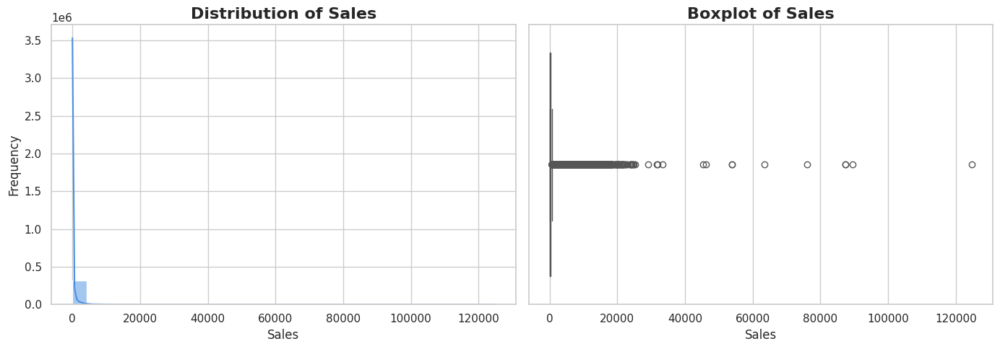

In [ ]:
sns.set(style="whitegrid", palette="pastel")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
sns.histplot(merged_df['sales'], bins=30, kde=True, color="#4a90e2", ax=axes[0])
axes[0].set_title('Distribution of Sales', fontsize=16, weight='bold')
axes[0].set_xlabel('Sales', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)

# Boxplot
sns.boxplot(x=merged_df['sales'], color="#f3722c", ax=axes[1])
axes[1].set_title('Boxplot of Sales', fontsize=16, weight='bold')
axes[1].set_xlabel('Sales', fontsize=12)

plt.tight_layout()
plt.show()


The histogram and boxplot of the 'sales' variable provide insights into its distribution. The histogram shows the frequency distribution of sales values. It reveals that the majority of sales fall within a specific range, represented by the peak in the histogram. However, there are also instances of higher sales values, leading to a right-skewed distribution. This skewness suggests that there are relatively fewer occurrences of very high sales, while the majority of sales are concentrated around lower values. The boxplot further confirms the presence of outliers in the data, as indicated by the points beyond the whiskers.

#### b. distribution of the 'transactions' variable:

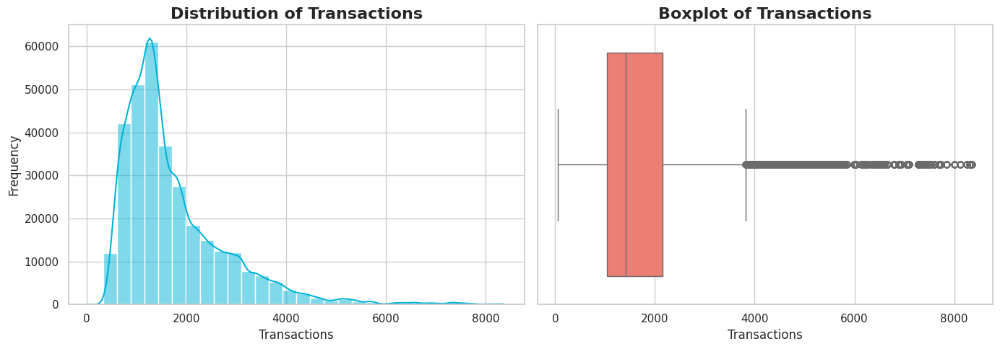

In [ ]:
sns.set(style="whitegrid", palette="muted")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
sns.histplot(merged_df['transactions'], bins=30, kde=True, color="#00b4d8", ax=axes[0])
axes[0].set_title('Distribution of Transactions', fontsize=16, weight='bold')
axes[0].set_xlabel('Transactions', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)

# Boxplot
sns.boxplot(x=merged_df['transactions'], color="#ff6f61", ax=axes[1])
axes[1].set_title('Boxplot of Transactions', fontsize=16, weight='bold')
axes[1].set_xlabel('Transactions', fontsize=12)

plt.tight_layout()
plt.show()


This histogram provides insights into the distribution of transactions in the dataset. The shape of the histogram indicates that the majority of transactions fall into a specific range, which is evident from the high frequency observed on the left side of the histogram. As the transactions increase, the frequency gradually decreases, forming a right-skewed distribution. This suggests that there are relatively fewer instances of high transaction volumes. Overall, the histogram highlights the presence of a cluster of transactions with a lower frequency, indicating a pattern in the data.

#### c. Distribution of the 'Daily Oil Price' variable:

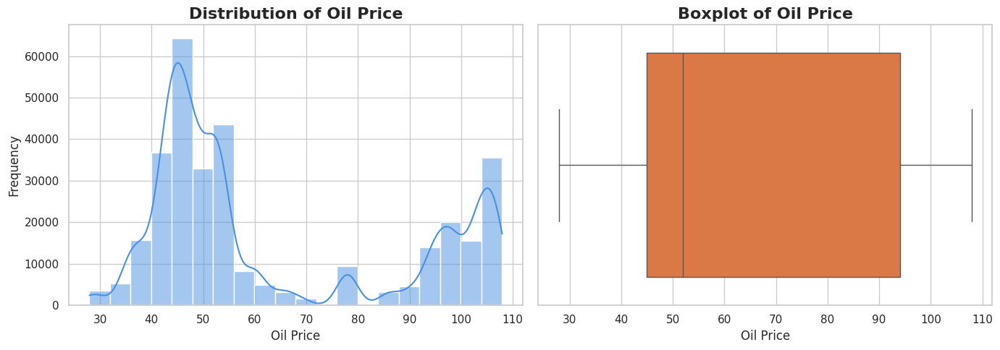

In [ ]:
sns.set(style="whitegrid", palette="pastel")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Histogram
sns.histplot(merged_df['dcoilwtico'], bins=20, kde=True, color="#4a90e2", ax=axes[0])
axes[0].set_title('Distribution of Oil Price', fontsize=16, weight='bold')
axes[0].set_xlabel('Oil Price', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)

# Boxplot
sns.boxplot(x=merged_df['dcoilwtico'], color="#f3722c", ax=axes[1])
axes[1].set_title('Boxplot of Oil Price', fontsize=16, weight='bold')
axes[1].set_xlabel('Oil Price', fontsize=12)

plt.tight_layout()
plt.show()

The histogram and boxplot of the 'dcoilwtico' variable reveal insights into its distribution. The histogram displays the frequency distribution of oil prices, indicating the number of occurrences for each price range.

### ii. Bivariate Analysis

#### a. Trend of sales over time.

In [ ]:
fig = px.line(merged_df, x='date', y='sales', title='Trend of Sales Over Time')

fig.update_traces(line=dict(color='#1f77b4', width=2.5))
fig.update_layout(
    title_font=dict(size=20, family='Arial', color='#333'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    font=dict(size=12),
    title_x=0.5,
    plot_bgcolor='white',
    xaxis=dict(showgrid=True, gridcolor='lightgray'),
    yaxis=dict(showgrid=True, gridcolor='lightgray'),
    hovermode="x unified"
)

fig.update_xaxes(rangeslider_visible=True)
fig.show()

The plot shows the trend of sales over time. From the graph, we can observe that the sales exhibit some variations and fluctuations over time. There are periods of both high and low sales, indicating potential seasonality or other factors affecting sales patterns.

#### b. Trend of Daily Crude oil Prices Over Time

In [ ]:
fig = px.line(oil_df, x='date', y='dcoilwtico', title='Trend of Oil Prices Over Time')
fig.update_layout(
    title_font=dict(size=20, family='Arial', color='#333'),
    xaxis_title_font=dict(size=16),
    yaxis_title_font=dict(size=16),
    font=dict(size=12),
    title_x=0.5,
    plot_bgcolor='white',
    xaxis=dict(showgrid=True, gridcolor='lightgray'),
    yaxis=dict(showgrid=True, gridcolor='lightgray'),
    hovermode="x unified"
)
fig.update_xaxes(rangeslider_visible=True)
fig.show()

We can see that there is a trend in the in the oil prices over time. We see that oil prices suffered a collapse towards the end of 2014 and have not recovered. In fact despite some volatility, oil prices are at the same level as they were in the beginning of 2015. As a result of this we may see a significant shift in store sales around late 2014. Looking at the unit sales data, this is not readily apparent. Although sales do appear to drop off in the early part of 2015, in late 2014 they are rising.

#### c. Total Count of Sales by Store Type

In [ ]:
sns.set_palette("viridis")

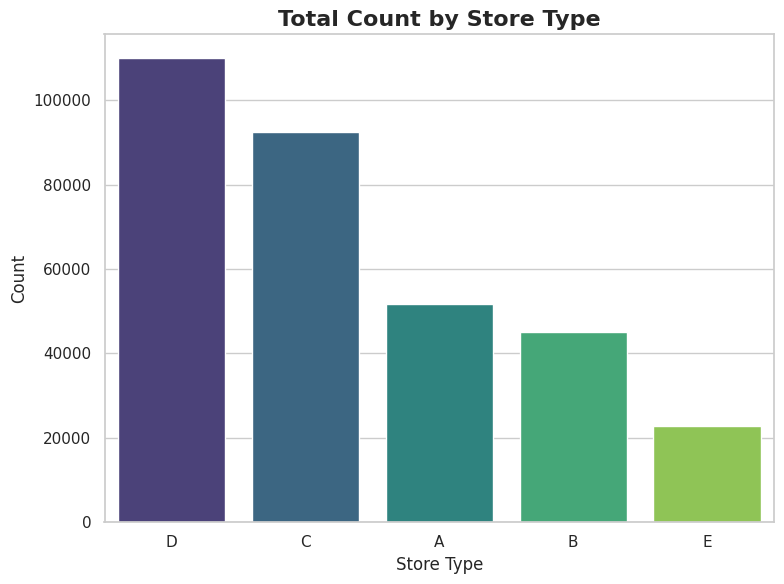

In [ ]:
store_type_counts = merged_df['store_type'].value_counts()
store_type_sales = merged_df.groupby('store_type')['sales'].sum()

plt.figure(figsize=(8, 6))
sns.barplot(x=store_type_counts.index, y=store_type_counts.values, palette="viridis")
plt.xlabel('Store Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Total Count by Store Type', fontsize=16, weight='bold')

plt.tight_layout()
plt.show()

What it shows: The number of records (data points) for each store type.

Interpretation: This tells you how many entries exist for each store type in the dataset.

The analysis of the total count of sales by store type provides insights into the sales performance and customer demand across different store types. Store Type D stands out with the highest count of sales, suggesting a strong customer base and popularity of products offered. Store Type C follows with a relatively lower count of sales, indicating a significant customer base as well. On the other hand, Store Types A, B, and E have lower counts, suggesting potential areas for improvement or the need to address competition.

#### d. Total Amount in Sales by Store Type

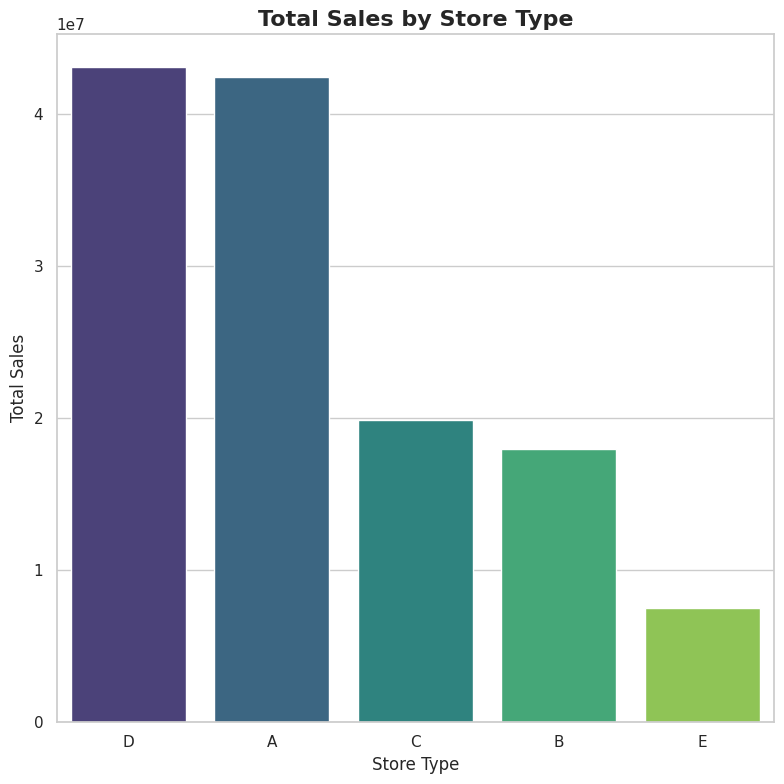

In [ ]:
store_type_sales = store_type_sales.sort_values(ascending=False)

plt.figure(figsize=(8, 8))
sns.barplot(x=store_type_sales.index, y=store_type_sales.values, order=store_type_sales.index, palette="viridis")
plt.xlabel('Store Type', fontsize=12)
plt.ylabel('Total Sales', fontsize=12)
plt.title('Total Sales by Store Type', fontsize=16, weight='bold')
plt.tight_layout()
plt.show()

The total sales amount varies across different store types. Store Type D has the highest total sales, indicating its significant contribution to the overall sales. Store Type A follows closely behind, demonstrating its substantial sales performance. Store Type C ranks third in terms of total sales, while Store Type B and Store Type E have lower sales amounts. Understanding the variations in sales by store type helps identify the key drivers of revenue and highlights the importance of certain store types in driving overall sales.

#### e. Average Sales by City

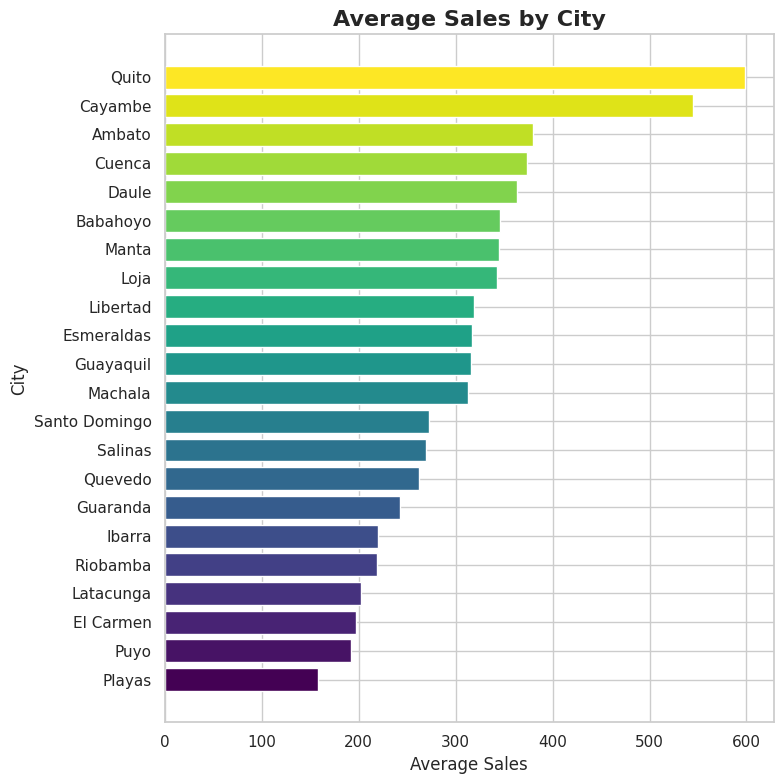

In [ ]:
average_sales_by_city = merged_df.groupby('city')['sales'].mean()
average_sales_by_city = average_sales_by_city.sort_values(ascending=True)

colors = cm.viridis(np.linspace(0, 1, len(average_sales_by_city)))

plt.figure(figsize=(8, 8))
plt.barh(average_sales_by_city.index, average_sales_by_city.values, color=colors)

plt.xlabel('Average Sales', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.title('Average Sales by City', fontsize=16, weight='bold')

plt.tight_layout()
plt.show()

The chart reveals notable disparities in average sales across cities. Quito and Cayambe lead significantly, suggesting they are key markets with higher consumer demand or economic activity. In contrast, Playas, Puyo, and El Carmen show the lowest average sales, indicating either smaller markets or reduced commercial activity. The mid-range cities like Guayaquil, Machala, and Esmeraldas represent moderate sales potential and might benefit from targeted strategies to increase market share. This distribution highlights potential opportunities for resource reallocation or market-specific planning.

#### f. Average Sales by State

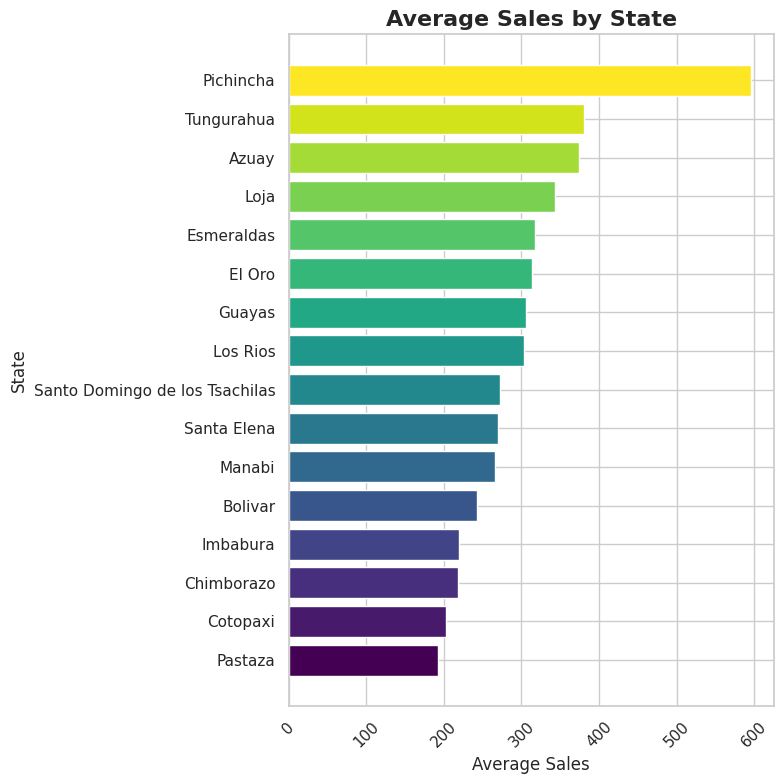

In [ ]:
average_sales_by_state = merged_df.groupby('state')['sales'].mean()

average_sales_by_state = average_sales_by_state.sort_values(ascending=True)

colors = cm.viridis(np.linspace(0, 1, len(average_sales_by_state)))

plt.figure(figsize=(8, 8))
plt.barh(average_sales_by_state.index, average_sales_by_state.values, color=colors)

plt.xlabel('Average Sales', fontsize=12)
plt.ylabel('State', fontsize=12)
plt.title('Average Sales by State', fontsize=16, weight='bold')

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

The chart highlights clear variations in average sales across Ecuadorian states. Pichincha stands out as the top-performing state by a significant margin, indicating its dominant role in sales performance—likely driven by urban centers like Quito. Tungurahua and Azuay also show strong sales, suggesting robust regional demand. On the lower end, states like Pastaza, Cotopaxi, and Chimborazo exhibit relatively weaker sales performance, which may reflect limited commercial activity or population density. These insights can guide strategic decisions such as where to focus marketing efforts or optimize distribution networks.

#### g. Relationship between sales and transactions.

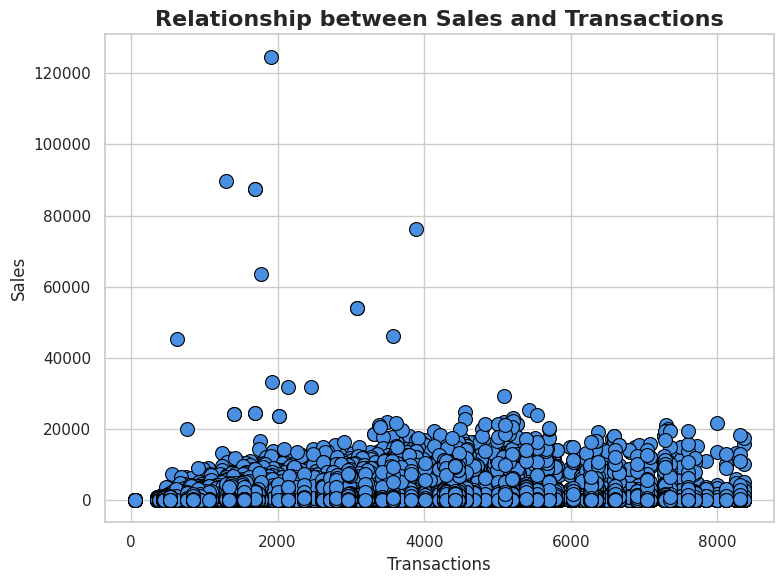

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='transactions', y='sales', data=merged_df, color="#4a90e2", s=100, edgecolor='black')

plt.xlabel('Transactions', fontsize=12)
plt.ylabel('Sales', fontsize=12)
plt.title('Relationship between Sales and Transactions', fontsize=16, weight='bold')

plt.tight_layout()
plt.show()

The scatter plot visualizes the relationship between sales and transactions in the dataset. Each data point represents a specific instance with corresponding sales and transaction values. Here are the key insights drawn from the scatter plot:

Clustered Data Points: The majority of data points cluster in the lower sales region, forming a specific concentration. This clustering suggests that there are certain transaction volumes that are consistently associated with particular sales levels. This concentration may indicate a common sales pattern or trend that occurs at specific transaction levels.

Outliers: Several data points deviate from the main cluster and are located at higher sales levels for relatively lower transaction volumes or vice versa. These outliers represent exceptional instances where sales are significantly different from what is typically observed for a given number of transactions. Identifying and understanding these outliers can provide valuable insights into unusual sales scenarios or exceptional business activities.

In summary, the scatter plot provides valuable insights into the relationship between sales and transactions. The clustering of data points around specific sales and transaction levels indicates the presence of common patterns. Additionally, outliers represent exceptional cases that warrant further investigation to understand the factors influencing sales and transactions in unique instances. This analysis can help businesses make informed decisions and devise effective strategies to improve sales performance.

### iii. Multivariate Analysis

#### a. Correlation matrix of numerical variables

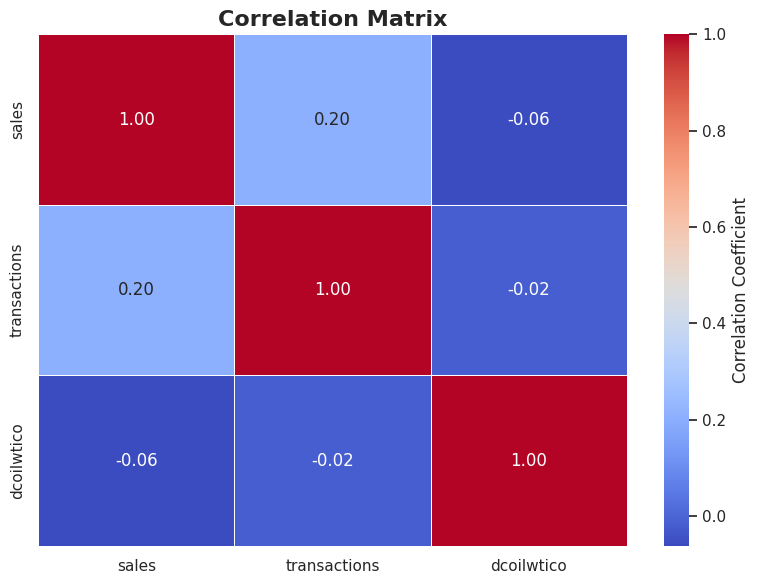

In [ ]:
numerical_vars = ['sales', 'transactions', 'dcoilwtico']

corr_matrix = merged_df[numerical_vars].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', cbar_kws={'label': 'Correlation Coefficient'},
            annot_kws={"size": 12}, linewidths=0.5)

plt.title('Correlation Matrix', fontsize=16, weight='bold')
plt.tight_layout()
plt.show()

Correlation values range from -1 to 1, where -1 represents a perfect negative correlation, 1 represents a perfect positive correlation, and 0 represents no correlation. The table helps us understand how the variables are related to each other, providing valuable insights into their interactions. In this correlation matrix, we can see the correlations between different variables:

- Sales and Transactions:
There is a weak positive correlation of approximately 0.200 between "Sales" and "Transactions." This suggests that there is a slight positive relationship between the number of transactions and the sales. It implies that when the number of transactions increases, there is a tendency for sales to increase as well, although the correlation is not very strong.

- Sales and Dcoilwito (Oil Prices):
There is a weak negative correlation of approximately -0.06 between "Sales" and "Dcoilwito" (Oil Prices). This indicates a slight negative relationship between sales and oil prices. It suggests that as oil prices increase, there is a tendency for sales to decrease slightly, though the correlation is not significant.

- Transactions and Dcoilwito (Oil Prices):
There is a very weak negative correlation of approximately -0.02 between "Transactions" and "Dcoilwito" (Oil Prices). This suggests that there is almost no relationship between the number of transactions and oil prices. It indicates that fluctuations in oil prices do not have a significant impact on the number of transactions.

Overall, the correlation values are relatively low, indicating that the relationships between these variables are not very strong. Other factors not considered in this correlation matrix may also influence sales, transactions, and oil prices. It's essential to explore additional factors to gain a more comprehensive understanding of their impact on sales and transactions.

#### b. Scatter Plot Marrix of numerical Variables

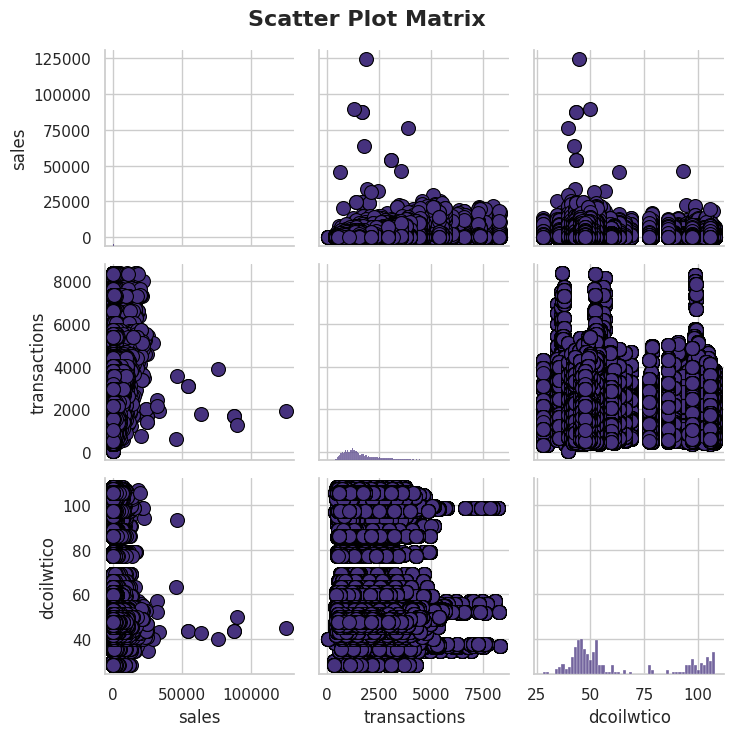

In [ ]:
numerical_vars = ['sales', 'transactions', 'dcoilwtico']

sns.pairplot(merged_df[numerical_vars],
             palette="coolwarm",
             plot_kws={'s': 100, 'edgecolor': 'black'})

plt.suptitle('Scatter Plot Matrix', fontsize=16, weight='bold', x=0.5)
plt.tight_layout()
plt.show()

The observations of the scatter plot matrix corroborate the observations from the correlation matrix.

Different store numbers exhibit different patterns in sales. Some store numbers have higher sales while others have lower cells.

In [ ]:
merged_df.columns

Index(['id', 'date', 'store_nbr', 'family', 'sales', 'onpromotion', 'city',
       'state', 'store_type', 'cluster', 'transactions', 'holiday_type',
       'locale', 'locale_name', 'description', 'transferred', 'dcoilwtico'],
      dtype='object')

In [ ]:
merged_df.head()

,id,date,store_nbr,family,sales,onpromotion,city,state,store_type,cluster,transactions,holiday_type,locale,locale_name,description,transferred,dcoilwtico
0,581.0,2013-01-01,25.0,LAWN AND GARDEN,2.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
1,580.0,2013-01-01,25.0,LADIESWEAR,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
2,579.0,2013-01-01,25.0,HOME CARE,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
3,578.0,2013-01-01,25.0,HOME APPLIANCES,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14
4,577.0,2013-01-01,25.0,HOME AND KITCHEN II,0.0,0.0,Salinas,Santa Elena,D,1,770,Holiday,National,Ecuador,Primer dia del ano,False,93.14


Saving the merged dataframe in a csv file for feature engineering

In [ ]:
merged_df.to_csv('merged_df.csv', index=False)